In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys
import os
import anndata

sys.path.append('/home/rwollman/MyProjects/AH/Repos/dredFISH')

from dredFISH.Utils import pathu
from dredFISH.Utils import basicu

plt.rcParams['figure.facecolor'] = 'white' 

In [4]:
seq_adata = anndata.read_h5ad(pathu.get_path('allen_wmb_tree'))

In [3]:
pth='/orangedata/ExternalData/Allen_WMB_2024Mar06/metadata/MERFISH-C57BL6J-638850-CCF/20230830/views'
file = 'cell_metadata_with_parcellation_annotation.csv'
fullfile = os.path.join(pth,file)
allen = pd.read_csv(fullfile)
allen = allen[allen['brain_section_label'] == 'C57BL6J-638850.40']



In [28]:
taxs_to_build_feature_mat = ['class','subclass','supertype','cluster']
feature_mats = dict()
for tx in taxs_to_build_feature_mat:
    feature_mat = seq_adata.obs.groupby(tx).apply(lambda x: seq_adata[x.index].X.mean(axis=0))
    feature_mats[tx] = feature_mat

In [35]:
# create the basis 
basis = dict()
for tx in taxs_to_build_feature_mat: 
    basis[tx] = np.vstack(np.array(allen[tx].map(feature_mats[tx])))



In [50]:
XY = np.array(allen[['z_ccf','y_ccf']])
XY[:,1] *= -1

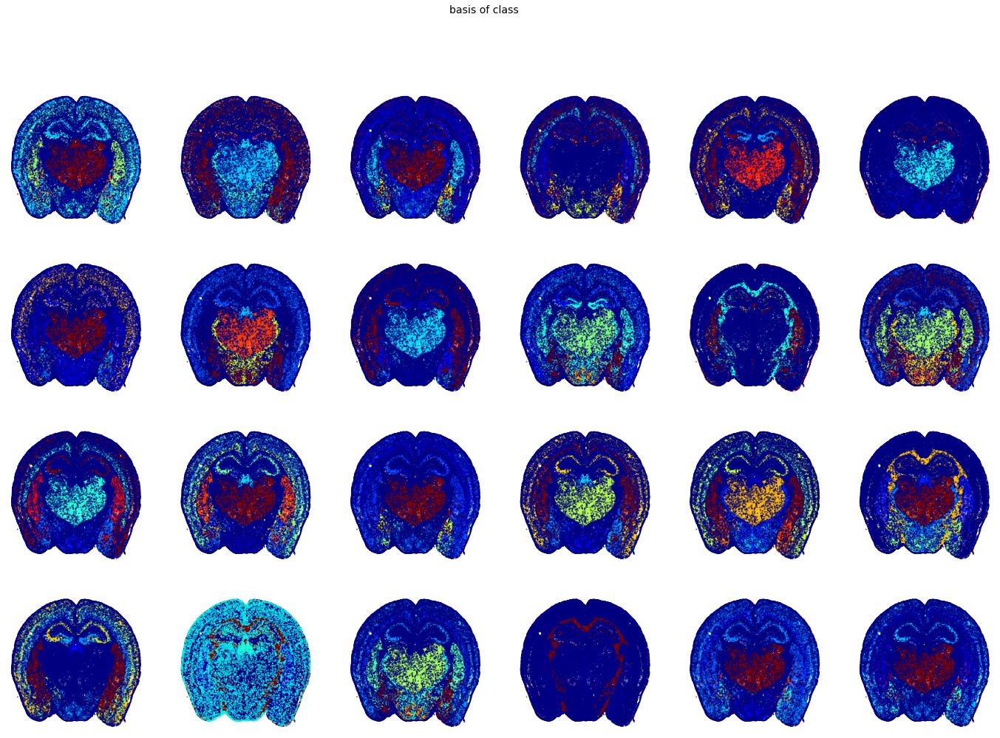

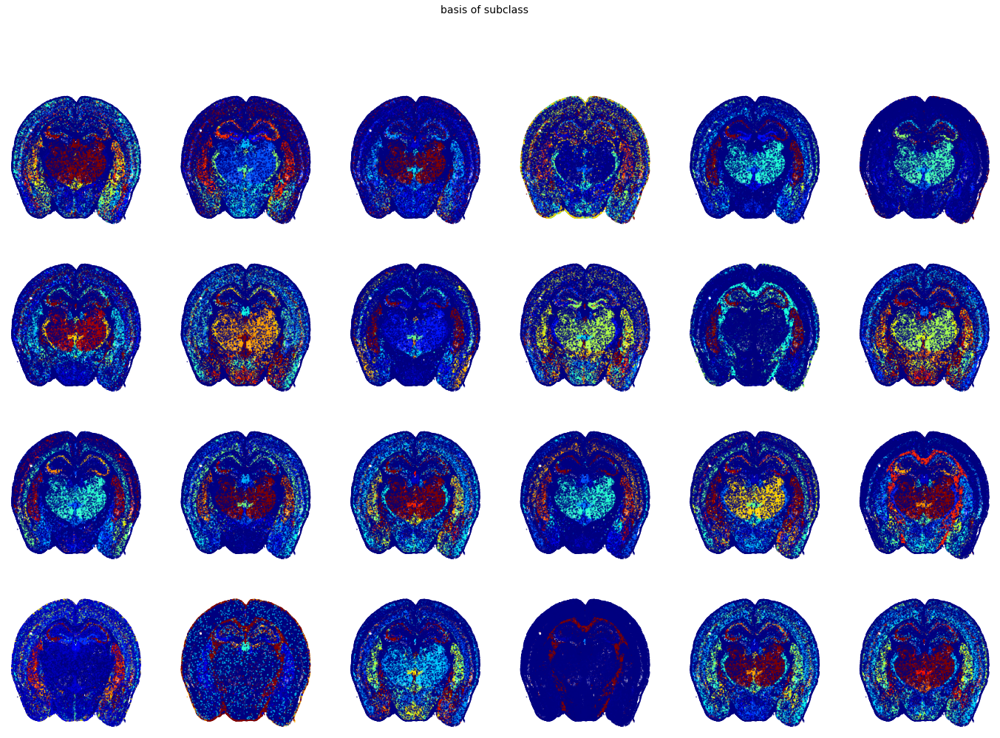

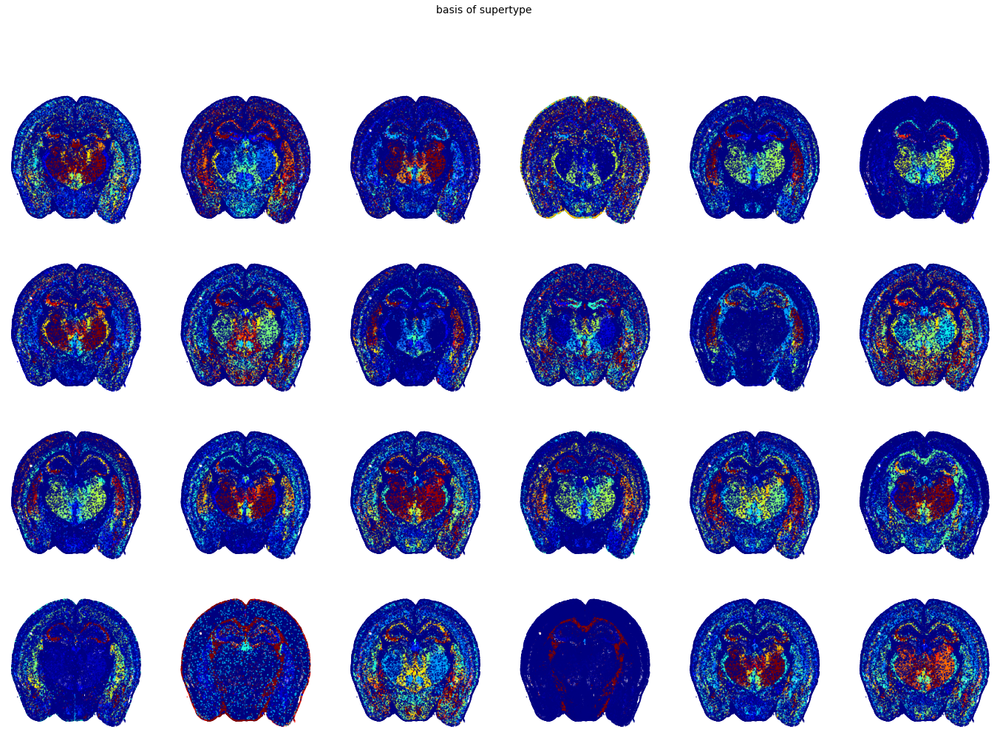

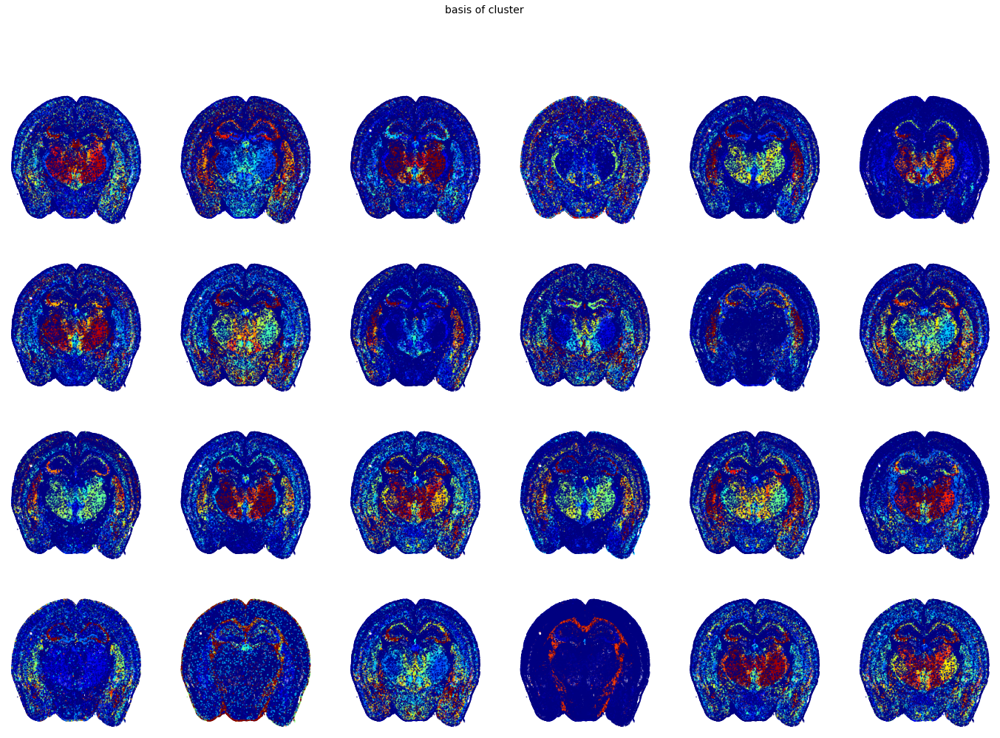

In [51]:
for tx in taxs_to_build_feature_mat: 
    fig,axs = plt.subplots(4,6,figsize=(24,16))
    axs = axs.flatten()
    vmins_ref = np.quantile(basis[tx],0.5,axis=0)
    vmaxs_ref = np.quantile(basis[tx],0.95,axis=0)
    for i in range(24):
        axs[i].scatter(x=XY[:,0],y=XY[:,1],c=basis[tx][:,i],s=1,alpha=0.5,vmin=vmins_ref[i],vmax=vmaxs_ref[i],cmap='jet')
        axs[i].axis('off')
    fig.suptitle(f'basis of {tx}', fontsize=14)


In [53]:
norm = dict()
for tx in taxs_to_build_feature_mat: 
   norm[tx] = basicu.normalize_fishdata_robust_regression(basis[tx])

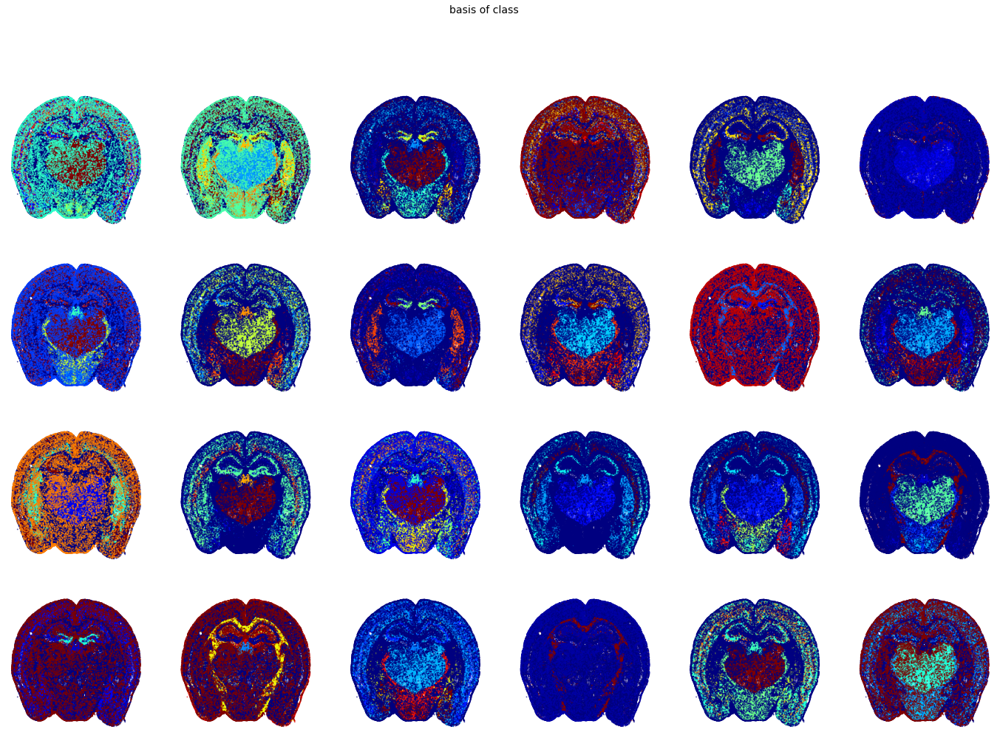

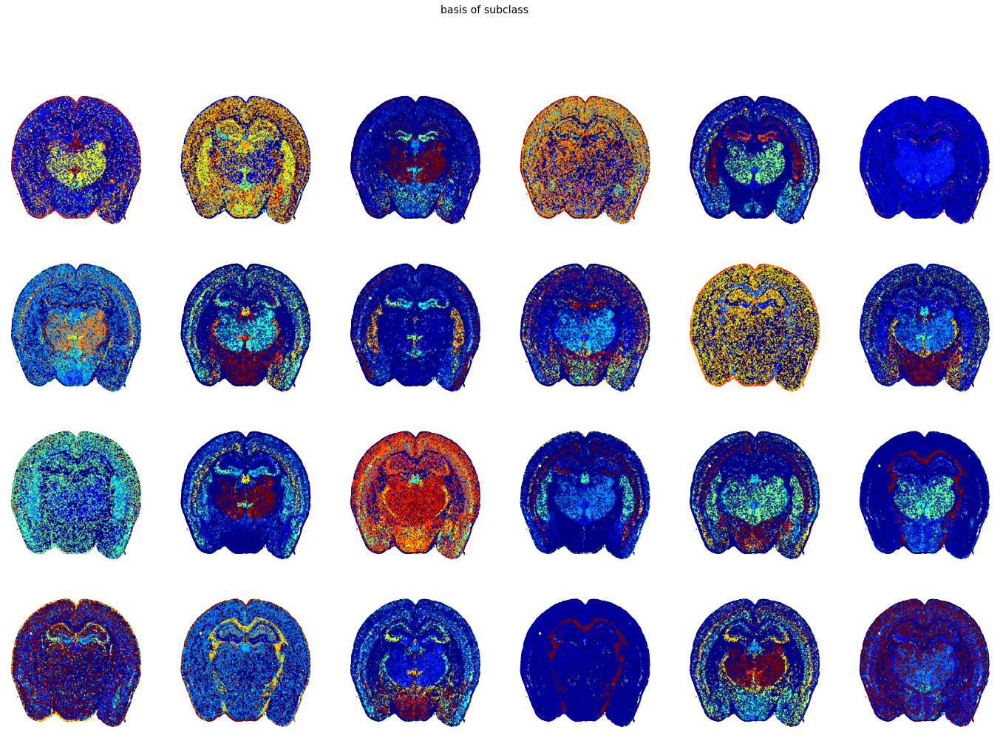

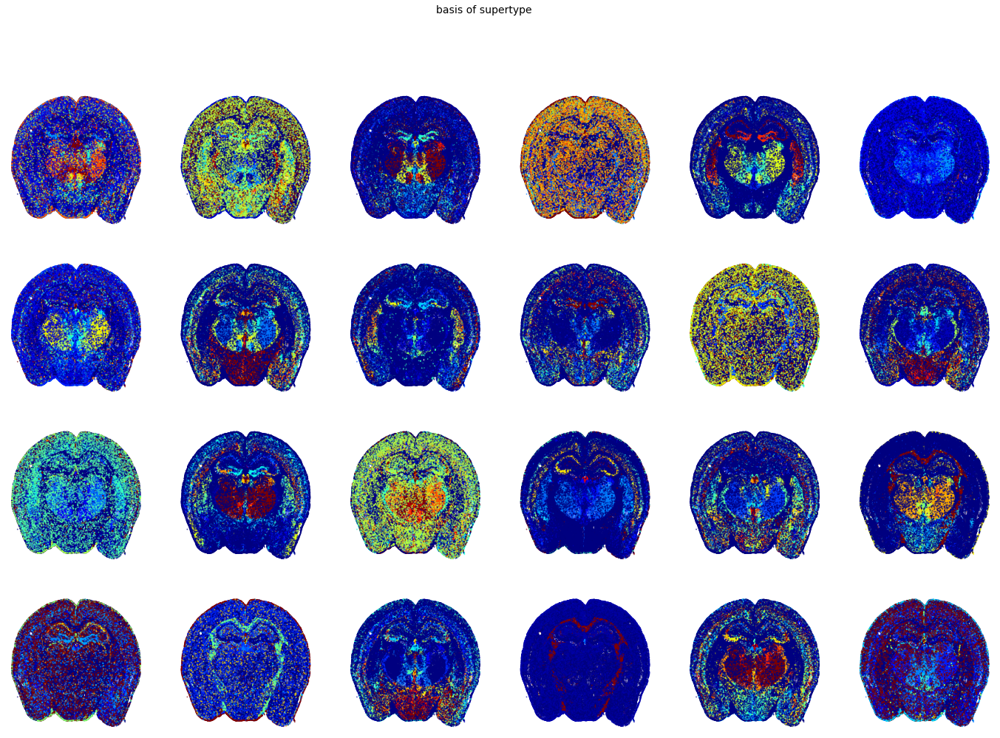

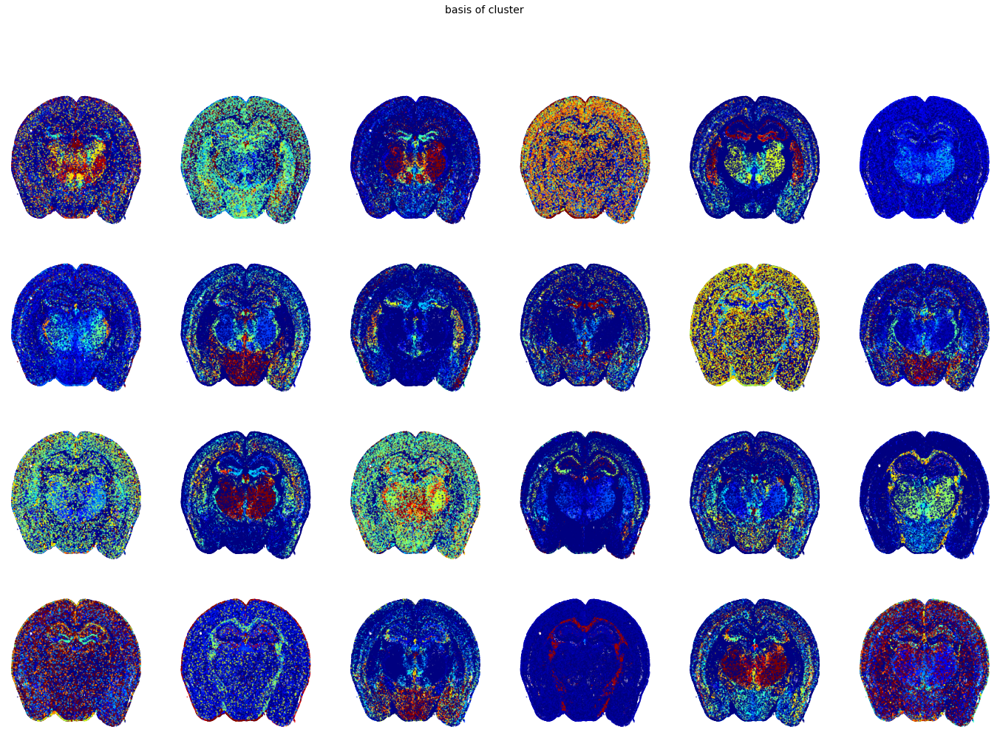

In [54]:
for tx in taxs_to_build_feature_mat: 
    fig,axs = plt.subplots(4,6,figsize=(24,16))
    axs = axs.flatten()
    vmins_ref = np.quantile(norm[tx],0.5,axis=0)
    vmaxs_ref = np.quantile(norm[tx],0.95,axis=0)
    for i in range(24):
        axs[i].scatter(x=XY[:,0],y=XY[:,1],c=norm[tx][:,i],s=1,alpha=0.5,vmin=vmins_ref[i],vmax=vmaxs_ref[i],cmap='jet')
        axs[i].axis('off')
    fig.suptitle(f'basis of {tx}', fontsize=14)

In [57]:
corr = np.corrcoef(basis['class'], rowvar=False)


<AxesSubplot:>

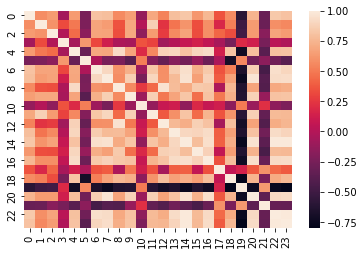

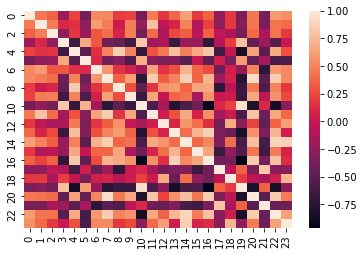

In [58]:
import seaborn as sns
sns.heatmap(corr)

plt.figure()
corr_norm  = np.corrcoef(norm['class'], rowvar=False)
sns.heatmap(corr_norm)